In [2]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

df = pd.read_parquet(
    "/beegfs/ws/0/s4610340-energy_behavior/yahor/kaggle-predict_energy_behavior_of_prosumers/data/processed/train/make_features/df_features.parquet",
    engine="fastparquet"
)

In [3]:
df_insp_c = df.loc[
    (df["county"]==0) &
    (df["product_type"]==1) &
    (df["is_business"]==1) &
    (df["is_consumption"]==1)
]
df_insp_c

,county,is_business,product_type,is_consumption,datetime,date,dayofyear,hour,day,weekday,...,target_per_eic_ratio_168_336,target_per_eic_ratio_48_216,target_per_eic_ratio_72_240,target_per_eic_ratio_48_72,target_per_eic_all_type_sum_ratio_48_72,target_per_eic_all_type_sum_ratio_168_336,target_per_eic_all_county_type_sum_ratio_48_72,target_per_eic_all_county_type_sum_ratio_168_336,is_country_holiday,target
row_id,,,,,,,,,,,,,,,,,,,,,
9,0,1,1,1,2021-09-01 00:00:00,2021-09-01,244,0,1,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,501.760
131,0,1,1,1,2021-09-01 01:00:00,2021-09-01,244,1,1,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,486.297
253,0,1,1,1,2021-09-01 02:00:00,2021-09-01,244,2,1,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,458.562
375,0,1,1,1,2021-09-01 03:00:00,2021-09-01,244,3,1,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,511.794
497,0,1,1,1,2021-09-01 04:00:00,2021-09-01,244,4,1,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,520.318
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017711,0,1,1,1,2023-05-31 19:00:00,2023-05-31,151,19,31,3,...,0.952011,0.988488,1.140880,1.285217,1.314281,0.980709,1.866825,0.971485,False,761.060
2017841,0,1,1,1,2023-05-31 20:00:00,2023-05-31,151,20,31,3,...,0.945819,0.914175,1.013730,1.213349,1.202847,1.037177,1.861499,0.917073,False,827.122
2017971,0,1,1,1,2023-05-31 21:00:00,2023-05-31,151,21,31,3,...,1.023156,0.938436,0.936809,1.207867,1.196216,1.042363,1.617476,0.984612,False,808.137


In [13]:
import numpy as np
df_insp_c["target_per_eic"] = df_insp_c["target"] / df_insp_c["eic_count"]
target_corr = df_insp_c.corr().loc["target_per_eic"].sort_values()
target_corr = target_corr.loc[np.abs(target_corr)>0.5]
px.bar(x=target_corr.index, y=target_corr)

/tmp/ipykernel_2447807/2356599459.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [21]:
px.line(df_insp_c, x="datetime", y="eic_count").show()
px.line(df_insp_c, x="datetime", y="installed_capacity").show()

In [17]:
px.line(x=df_insp_c["datetime"], y=df_insp_c["target"])

In [18]:
px.line(x=df_insp_c["datetime"], y=df_insp_c["target"]/df_insp_c["installed_capacity"])

In [22]:
px.line(x=df_insp_c["datetime"], y=df_insp_c["target_per_eic"])

In [23]:
px.line(x=df_insp_c["datetime"], y=df_insp_c["target_per_eic"]-df_insp_c["target_per_eic_48h"])

In [44]:
px.line(x=df_insp_c["datetime"], y=df_insp_c["target_per_eic"]-df_insp_c["target_per_eic_168h"])

In [46]:
def mean_diff(df):
    d = df_insp_c["target_per_eic"]
    lags = [48, 168]
    for lag in lags:
        d+= df_insp_c["target_per_eic"]-df_insp_c[f"target_per_eic_{lag}h"]
    
    return d/len(lags)

In [48]:
px.line(x=df_insp_c["datetime"], y=mean_diff(df_insp_c))

In [26]:
import statsmodels.api as sm

In [33]:
autocorr = sm.tsa.stattools.acf(
    df_insp_c["target_per_eic"]-df_insp_c["target_per_eic_48h"], 
    adjusted=False, 
    nlags=24*31, 
    qstat=False, 
    fft=True, 
    alpha=None, 
    bartlett_confint=True, 
    missing='drop'
)

TypeError: line() got an unexpected keyword argument 'mode'

In [37]:
go.Figure(
    go.Scatter(
        x=list(range(24*31)),
        y=autocorr
    )
)

In [43]:
168*3

504

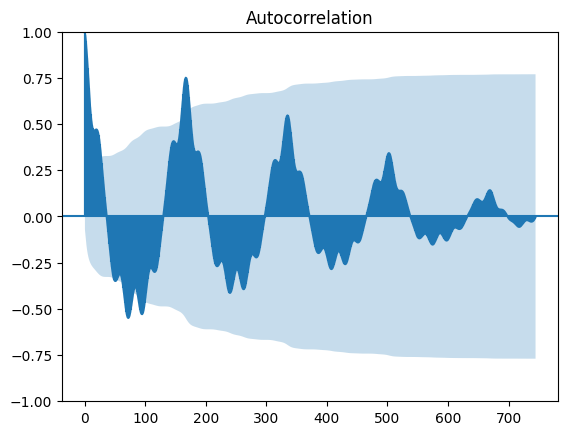

In [41]:
ax = sm.graphics.tsa.plot_acf(autocorr, lags=24*31, use_vlines=True, linestyle="-", marker="")